In [2]:
from google.colab import files
files.upload()

Saving spam.csv to spam (3).csv


{'spam.csv': b'Column1,Column2,Column3,Column4,Column5,Column6,Column7,Column8,Column9,Column10,Column11,Column12,Column13,Column14,Column15,Column16,Column17,Column18,Column19,Column20,Column21,Column22,Column23,Column24,Column25,Column26,Column27,Column28,Column29,Column30,Column31,Column32,Column33,Column34,Column35,Column36,Column37,Column38,Column39,Column40,Column41,Column42,Column43,Column44,Column45,Column46,Column47,Column48,Column49,Column50,Column51,Column52,Column53,Column54,Column55,Column56,Column57,Column58\r\n0,0.64,0.64,0,0.32,0,0,0,0,0,0,0.64,0,0,0,0.32,0,1.29,1.93,0,0.96,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.778,0,0,3.756,61,278,1\r\n0.21,0.28,0.5,0,0.14,0.28,0.21,0.07,0,0.94,0.21,0.79,0.65,0.21,0.14,0.14,0.07,0.28,3.47,0,1.59,0,0.43,0.43,0,0,0,0,0,0,0,0,0,0,0,0,0.07,0,0,0,0,0,0,0,0,0,0,0,0,0.132,0,0.372,0.18,0.048,5.114,101,1028,1\r\n0.06,0,0.71,0,1.23,0.19,0.19,0.12,0.64,0.25,0.38,0.45,0.12,0,1.75,0.06,0.06,1.03,1.36,0.32,0.51,0,1.16,0.06,0,

In [2]:
import csv
from sklearn.ensemble import RandomForestClassifier
import numpy as np
import sys
import math
import random
import pandas as pd
from sklearn.model_selection import train_test_split
sys.setrecursionlimit(10**6)
# Implement your decision tree below

class DecisionTree():

    def gini(self,labels):# gini index calculation
        p0=p1=0
        
        for r in labels:
            if r[-1]==0:
                p0=p0+1
            elif r[-1]==1:
                p1=p1+1
        if p0!=0 and p1!=0:
            return 1-(p1/(p0+p1))**2-(p0/(p0+p1))**2
        else:
            return 0
    def gin(self,parent,c1,c2):# gini impurity
        return (self.gini(c1))*len(c1)/len(parent)+(self.gini(c2))*len(c2)/len(parent)
    def split_left(self,thresh,index,data_set):#left child
        left=[]
        for parent in data_set:
            if float(parent[index])<float(thresh):
                left.append(parent)
        return left
    def split_right(self,thresh,index,data_set):#right child
        right=[]
        for parent in data_set:
            if float(parent[index])>=float(thresh):
                right.append(parent)
        return right

    def best_split(self,training_set,m):#selecting best value to split on using gini impurity and using 20 values between the minimum and maximum possible values.
        min_gin=(np.inf)
        corres_ind=0
        thresh_max=0
        #m=math.floor(2*math.sqrt(len(training_set[0])))
        #print("m is")
        #print(m)
        #m=1
        bruh=random.sample(range(0,len(training_set[0])-1), m)
        #print(bruh)
        for i in bruh:
        #for i in range(0,len(training_set[0]-1)):
            thresh=[]
            #print(thresh)          
            for j in range(0,len(training_set)):
                thresh.append(float(training_set[j][i]))
                #print(thresh)
            features=np.linspace(min(thresh),max(thresh),30)
            for l in range(0,len(features)):
                
                left=self.split_left(float(features[l]),i,training_set)
                right=self.split_right(float(features[l]),i,training_set)
                gin=self.gin(training_set,left,right)
                if float(gin)<float(min_gin):
                    thresh_max=features[l]
                    corres_ind=i

                    min_gin=gin
    
        return [thresh_max,corres_ind]
            

    tree = {}

    def learn(self, training_set,m):
        # implement this function
        self.tree = {}
        #print(self.gini(training_set))
        if self.gini(training_set)!=0 and len(training_set)>2 :
            #print(c0,c1)
            
            self.tree['thresh_val']=(self.best_split(training_set,m))[0]
            self.tree['index']=(self.best_split(training_set,m))[1]
            thre=self.tree['thresh_val']
            ind=self.tree['index']
            left_subtree=DecisionTree()#recursively growing the tree
            right_subtree=DecisionTree()
            left=self.split_left(thre,ind,training_set)
            right=self.split_right(thre,ind,training_set)
            left_subtree.learn(left,m)
            right_subtree.learn(right,m)
            self.tree['left']=left_subtree.tree
            self.tree['right']=right_subtree.tree
            self.tree['value']=None
        else: # if the node is pure, it will be converted into a leaf node
            self.tree['right']=None
            self.tree['left']=None
            self.tree['index']=None
            self.tree['thresh_val']=None
            c0=0
            c1=0
            for instance in training_set:
                #print(instance)
                
                
                if float(instance[-1])==0:
                    
                    c0=c0+1
                elif float(instance[-1])==1:
                    c1=c1+1
            #print(c0,c1)
            if c0>=c1:
                self.tree['value']=0
            elif c1>c0:
                self.tree['value']=1
        return self.tree        


    # implement this function
    def classify(self, test_instance,x):# we find the value in the dictionary recursively
        #result = 0 # baseline: always classifies as 0
        if (x['value']!=None): 
            
             
            return x['value']
        else:
            
            value_rec=test_instance[x['index']]
            if float(value_rec)<float(x['thresh_val']):
                #print(float(value_rec),float(x['thresh_val']))
                #print(x['left'])
                return self.classify(test_instance,x['left'])
            elif float(value_rec)>=float(x['thresh_val']):
                return self.classify(test_instance,x['right'])

        #return result

def run_decision_tree(trip,m,X_train,X_test):
    all_indices=[]
    # Load data set
    #data = pd.read_csv("spam.csv")

    
    

        #print(X_train)
        #print(X_test)
    dicts=[]
    for tr in range(0,trip):
        tree = DecisionTree()
        # Construct a tree using training set
        #choosing a subset of samples
        
        indices=random.choices(range(0,len(X_train)), k=math.floor(0.2*len(X_train)))
        
        x_subset=X_train[indices]
        dic=tree.learn(x_subset,m)
        print(dic)
        dicts.append(dic)

    # Classify the test set using the tree we just constructed
    
    majority=[]
    
    for ins in X_test:
        results = []
        for i in range(0,len(dicts)):
            result = tree.classify( ins,dicts[i] )
            #print(dic)
            results.append(result)
        #print(results.count(0),results.count(1))
        if results.count(0)>=results.count(1):
            check=0

        else:
            check=1
        
        majority.append(check==ins[-1])    
    


    # Accuracy
    accuracy = float(majority.count(True))/float(len(majority))
    print("accuracy: %.4f" % accuracy)


   

In [3]:

if __name__ == "__main__":
    data = pd.read_csv("spam.csv")
    #data = pd.read_csv("wine-dataset.csv")
    print(data)
    X_ = data.to_numpy()
    X_train, X_test= train_test_split(
    X_, test_size=0.3, random_state=42)
    trip=15
    m=math.floor(2*7)
    run_decision_tree(trip,m,X_train,X_test)
    train_features=X_train[:,0:-1]
    test_features=X_test[:,0:-1]
    train_labels=X_train[:,-1]
    test_labels = X_test[:,-1]
    rf = RandomForestClassifier(n_estimators = trip,min_samples_leaf=2,max_features=m, random_state = None,max_samples=math.floor(0.2*len(X_train)))
# Train the model on training data
    rf.fit(train_features, train_labels);
    predictions = rf.predict(test_features)
    errors = abs(predictions - test_labels)
    print(rf.score(test_features,test_labels))    


      Column1  Column2  Column3  ...  Column56  Column57  Column58
0        0.00     0.64     0.64  ...        61       278         1
1        0.21     0.28     0.50  ...       101      1028         1
2        0.06     0.00     0.71  ...       485      2259         1
3        0.00     0.00     0.00  ...        40       191         1
4        0.00     0.00     0.00  ...        40       191         1
...       ...      ...      ...  ...       ...       ...       ...
4596     0.31     0.00     0.62  ...         3        88         0
4597     0.00     0.00     0.00  ...         4        14         0
4598     0.30     0.00     0.30  ...         6       118         0
4599     0.96     0.00     0.00  ...         5        78         0
4600     0.00     0.00     0.65  ...         5        40         0

[4601 rows x 58 columns]
{'thresh_val': 0.38310344827586207, 'index': 52, 'left': {'thresh_val': 0.025517241379310343, 'index': 15, 'left': {'thresh_val': 0.2896551724137931, 'index': 20, 'left':

In [7]:
# exploring sensitivity of m
data = pd.read_csv("spam.csv")
    #data = pd.read_csv("wine-dataset.csv")

X_ = data.to_numpy()
X_train, X_test= train_test_split(
X_, test_size=0.3, random_state=42)

train_features=X_train[:,0:-1]
test_features=X_test[:,0:-1]
train_labels=X_train[:,-1]
test_labels = X_test[:,-1]
M=[1,math.floor(0.5*np.sqrt(len(X_train[0]))),math.floor(np.log2(len(X_train[0]))),math.floor(np.sqrt(len(X_train[0]))),math.floor(2*np.sqrt(len(X_train[0]))),math.floor((len(X_train[0]))/3),len(X_train[0])-1]
for m in M:

    rf = RandomForestClassifier(n_estimators = trip,min_samples_leaf=2,max_features=m, random_state = None,max_samples=math.floor(0.2*len(X_train)))
# Train the model on training data
    rf.fit(train_features, train_labels);
    predictions = rf.predict(test_features)
    errors = abs(predictions - test_labels)
    print(rf.score(test_features,test_labels)) 

0.8848660391020999
0.9304851556842868
0.9239681390296887
0.9333816075307748
0.9304851556842868
0.9297610427226647
0.9297610427226647


In [3]:
# using gini index and only a few thresholds for best split.

import csv
from google.colab import files
import numpy as np
import sys
import math
import random
import pandas as pd
from sklearn.model_selection import train_test_split
sys.setrecursionlimit(10**6)
# Implement your decision tree below

class DecisionTree():

    def gini(self,labels):# gini index calculation
        p0=p1=0
        
        for r in labels:
            if r[-1]==0:
                p0=p0+1
            elif r[-1]==1:
                p1=p1+1
        if p0!=0 and p1!=0:
            return 1-(p1/(p0+p1))**2-(p0/(p0+p1))**2
        else:
            return 0
    def gin(self,parent,c1,c2):# gini impurity
        return (self.gini(c1))*len(c1)/len(parent)+(self.gini(c2))*len(c2)/len(parent)
    def split_left(self,thresh,index,data_set):#left child
        left=[]
        for parent in data_set:
            if float(parent[index])<float(thresh):
                left.append(parent)
        return left
    def split_right(self,thresh,index,data_set):#right child
        right=[]
        for parent in data_set:
            if float(parent[index])>=float(thresh):
                right.append(parent)
        return right

    def best_split(self,training_set,m):#selecting best value to split on using gini impurity and using 20 values between the minimum and maximum possible values.
        min_gin=(np.inf)
        corres_ind=0
        thresh_max=0
        #print("m is")
        #print(m)
        #m=1
        bruh=random.sample(range(0,len(training_set[0])-1), m)
        #print(bruh)
        for i in bruh:
        #for i in range(0,len(training_set[0]-1)):
            thresh=[]
            #print(thresh)          
            for j in range(0,len(training_set)):
                y=float(training_set[j][i])
                if y not in thresh:
                    thresh.append(y)
                #print(thresh)
            features=np.linspace(min(thresh),max(thresh),20)
            for l in range(0,len(features)):
                
                left=self.split_left(float(features[l]),i,training_set)
                right=self.split_right(float(features[l]),i,training_set)
                gin=self.gin(training_set,left,right)
                if float(gin)<float(min_gin):
                    thresh_max=features[l]
                    corres_ind=i

                    min_gin=gin
    
        return [thresh_max,corres_ind]
            

    tree = {}

    def learn(self, training_set,m):
        # implement this function
        self.tree = {}
        #print(self.gini(training_set))
        if self.gini(training_set)!=0 and len(training_set)>2:
            #print(c0,c1)
            
            self.tree['thresh_val']=(self.best_split(training_set,m))[0]
            self.tree['index']=(self.best_split(training_set,m))[1]
            thre=self.tree['thresh_val']
            ind=self.tree['index']
            left_subtree=DecisionTree()#recursively growing the tree
            right_subtree=DecisionTree()
            left=self.split_left(thre,ind,training_set)
            right=self.split_right(thre,ind,training_set)
            left_subtree.learn(left,m)
            right_subtree.learn(right,m)
            self.tree['left']=left_subtree.tree
            self.tree['right']=right_subtree.tree
            self.tree['value']=None
        else: # if the node is pure, it will be converted into a leaf node
            self.tree['right']=None
            self.tree['left']=None
            self.tree['index']=None
            self.tree['thresh_val']=None
            c0=0
            c1=0
            for instance in training_set:
                #print(instance)
                
                
                if float(instance[-1])==0:
                    
                    c0=c0+1
                elif float(instance[-1])==1:
                    c1=c1+1
            #print(c0,c1)
            if c0>=c1:
                self.tree['value']=0
            elif c1>c0:
                self.tree['value']=1
        return self.tree        


    # implement this function
    def classify(self, test_instance,x):# we find the value in the dictionary recursively
        #result = 0 # baseline: always classifies as 0
        if (x['value']!=None): 
            
             
            return x['value']
        else:
            
            value_rec=test_instance[x['index']]
            if float(value_rec)<float(x['thresh_val']):
                #print(float(value_rec),float(x['thresh_val']))
                #print(x['left'])
                return self.classify(test_instance,x['left'])
            elif float(value_rec)>=float(x['thresh_val']):
                return self.classify(test_instance,x['right'])

        #return result

def run_decision_tree_oob(trip,m,X_train,X_test):
    
    # Load data set
    data = pd.read_csv("spam.csv")
    #print(data)
    
    
    X_ = data.to_numpy()
    X_train, X_test= train_test_split(
    X_, test_size=0.3, random_state=42)

        #print(X_train)
        #print(X_test)
    # Split training/test sets
    # You need to modify the following code for cross validation.
    dicts=[]
    subspaces=[]
    majority=[]
    for tr in range(0,trip):
        tree = DecisionTree()
        # Construct a tree using training set
        #choosing a subset of samples
        #print(randd)
        indices=random.choices(range(0,len(X_train)), k=math.floor(0.2*len(X_train)))
        
        x_subset=X_train[indices]
        dic=tree.learn(x_subset,m)
        subspaces.append(indices)
        dicts.append(dic)
        print(dic)
    
    for rec in range(0,len(X_train)):
        res=[]
        #print(subspaces)
        for sub in range(0,len(subspaces)):
            if rec not in subspaces[sub]:
                re = tree.classify( X_train[rec],dicts[sub] )
                #print(re)
                res.append(re)
        if res.count(0)==res.count(1)==0:
            continue
        else:
            if res.count(0)>=res.count(1):
                check=0

            else:
                check=1
        
        majority.append(check==X_train[rec][-1])        
            
                


    #print(dic['left']['left']['left']['value'])
    #print(dicts)
    # Classify the test set using the tree we just constructed
    
   
    # Accuracy
    #print(majority)
    accuracy = float(majority.count(True))/float(len(majority))
    print("oob accuracy: %.4f" % accuracy)
    majority=[]
    
    for ins in X_test:
        results = []
        for i in range(0,len(dicts)):
            result = tree.classify( ins,dicts[i] )
            #print(dic)
            results.append(result)
        #print(results.count(0),results.count(1))
        if results.count(0)>=results.count(1):
            check=0

        else:
            check=1
        
        majority.append(check==ins[-1])    
    


    # Accuracy
    accuracy = float(majority.count(True))/float(len(majority))
    print("accuracy: %.4f" % accuracy)

    

In [4]:

data = pd.read_csv("spam.csv")
    #data = pd.read_csv("wine-dataset.csv")
print(data)
X_ = data.to_numpy()
X_train, X_test= train_test_split(
X_, test_size=0.3, random_state=42)
trip=10
     
M=[1,math.floor(0.5*np.sqrt(len(X_train[0]))),math.floor(np.log2(len(X_train[0]))),math.floor(np.sqrt(len(X_train[0]))),math.floor(2*np.sqrt(len(X_train[0]))),math.floor((len(X_train[0]))/3),len(X_train[0])-1]



  

      Column1  Column2  Column3  ...  Column56  Column57  Column58
0        0.00     0.64     0.64  ...        61       278         1
1        0.21     0.28     0.50  ...       101      1028         1
2        0.06     0.00     0.71  ...       485      2259         1
3        0.00     0.00     0.00  ...        40       191         1
4        0.00     0.00     0.00  ...        40       191         1
...       ...      ...      ...  ...       ...       ...       ...
4596     0.31     0.00     0.62  ...         3        88         0
4597     0.00     0.00     0.00  ...         4        14         0
4598     0.30     0.00     0.30  ...         6       118         0
4599     0.96     0.00     0.00  ...         5        78         0
4600     0.00     0.00     0.65  ...         5        40         0

[4601 rows x 58 columns]


In [5]:
run_decision_tree_oob(trip,M[0],X_train,X_test)

{'thresh_val': 526.6842105263158, 'index': 43, 'left': {'thresh_val': 1.0207894736842105, 'index': 52, 'left': {'thresh_val': 0.2923157894736842, 'index': 38, 'left': {'thresh_val': 0.12526315789473683, 'index': 6, 'left': {'thresh_val': 0.6010526315789474, 'index': 40, 'left': {'thresh_val': 0.2810526315789474, 'index': 24, 'left': {'thresh_val': 0.0, 'index': 24, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.04457894736842105, 'index': 53, 'left': {'thresh_val': 0.2563157894736842, 'index': 39, 'left': {'thresh_val': 1.0526315789473684, 'index': 55, 'left': {'thresh_val': 0.0, 'index': 47, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.0, 'index': 49, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.0, 'index': 21, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value

In [6]:
run_decision_tree_oob(trip,M[1],X_train,X_test)

{'thresh_val': 0.21052631578947367, 'index': 25, 'left': {'thresh_val': 0.5389473684210526, 'index': 7, 'left': {'thresh_val': 1.503157894736842, 'index': 12, 'left': {'thresh_val': 0.23894736842105263, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.05578947368421053, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.07852631578947368, 'index': 23, 'left': {'thresh_val': 0.3189473684210526, 'index': 20, 'left': {'thresh_val': 0.19789473684210526, 'index': 54, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 4.25, 'index': 19, 'left': {'thresh_val': 0.37578947368421045, 'index': 13, 'left': {'thresh_val': 0.21473684210526317, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.14210526315789473, 'index': 

In [7]:
run_decision_tree_oob(trip,M[2],X_train,X_test)

{'thresh_val': 62.89473684210526, 'index': 20, 'left': {'thresh_val': 0.23894736842105263, 'index': 20, 'left': {'thresh_val': 0.6010526315789474, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.08157894736842106, 'index': 51, 'left': {'thresh_val': 1.736842105263158, 'index': 4, 'left': {'thresh_val': 0.6010526315789474, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.9568421052631578, 'index': 53, 'left': {'thresh_val': 0.06368421052631579, 'index': 32, 'left': {'thresh_val': 0.04842105263157895, 'index': 52, 'left': {'thresh_val': 4.784210526315789, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 1.7536842105263157, 'index': 11, 'left': {'thresh_val': 0.9689473684210526, 'index': 17, 'left': {'thresh_val': 0.14605263157894738, 'index': 54, 'left': {'right': 

In [8]:
run_decision_tree_oob(trip,M[3],X_train,X_test)

{'thresh_val': 0.16157894736842104, 'index': 20, 'left': {'thresh_val': 1.0942105263157895, 'index': 54, 'left': {'thresh_val': 0.32894736842105265, 'index': 51, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.0, 'index': 24, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.0, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.21052631578947367, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.21052631578947367, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 1.5137894736842106, 'index': 37, 'left': {'thresh_val': 0.0, 'index': 26, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 

In [9]:
run_decision_tree_oob(trip,M[4],X_train,X_test)

{'thresh_val': 0.10321052631578946, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.10321052631578946, 'index': 22, 'left': {'thresh_val': 0.2921052631578947, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 177.52631578947367, 'index': 6, 'left': {'thresh_val': 0.07457894736842104, 'index': 6, 'left': {'thresh_val': 62.89473684210526, 'index': 52, 'left': {'thresh_val': 0.41278947368421054, 'index': 56, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.41278947368421054, 'index': 52, 'left': {'thresh_val': 0.41278947368421054, 'index': 8, 'left': {'thresh_val': 0.9568421052631578, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.41278947368421054, 'index': 20, 'left': {'thresh_val': 1.2378947368421052

In [10]:
run_decision_tree_oob(trip,M[5],X_train,X_test)

{'thresh_val': 0.16421052631578947, 'index': 23, 'left': {'thresh_val': 0.2921052631578947, 'index': 52, 'left': {'thresh_val': 36.1578947368421, 'index': 4, 'left': {'thresh_val': 0.3826315789473684, 'index': 20, 'left': {'thresh_val': 0.5039473684210526, 'index': 52, 'left': {'thresh_val': 0.3826315789473684, 'index': 52, 'left': {'thresh_val': 2.6315789473684212, 'index': 52, 'left': {'thresh_val': 0.05657894736842105, 'index': 15, 'left': {'thresh_val': 64.57894736842105, 'index': 54, 'left': {'thresh_val': 2.6315789473684212, 'index': 52, 'left': {'thresh_val': 0.05657894736842105, 'index': 54, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 2.6315789473684212, 'index': 55, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 65.73684210526315, 'index': 3, 'left': {'thresh_val': 0.05657894736842105, 'index': 51, 'left': {'thresh_val': 0.05578947368421053, 'index':

In [12]:
run_decision_tree_oob(trip,M[6],X_train,X_test)

{'thresh_val': 0.10726315789473685, 'index': 52, 'left': {'thresh_val': 0.22878947368421051, 'index': 51, 'left': {'thresh_val': 0.23894736842105263, 'index': 6, 'left': {'thresh_val': 0.011052631578947368, 'index': 6, 'left': {'thresh_val': 0.19736842105263158, 'index': 21, 'left': {'thresh_val': 0.0663157894736842, 'index': 52, 'left': {'thresh_val': 0.25052631578947365, 'index': 4, 'left': {'thresh_val': 1914.4736842105262, 'index': 56, 'left': {'thresh_val': 7.014736842105262, 'index': 18, 'left': {'thresh_val': 2.1052631578947367, 'index': 15, 'left': {'thresh_val': 0.7515789473684209, 'index': 35, 'left': {'thresh_val': 1.0178947368421052, 'index': 11, 'left': {'thresh_val': 0.3757894736842105, 'index': 38, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.20210526315789473, 'index': 32, 'left': {'right': None, 'left': None, 'index': None, 'thresh_val': None, 'value': 0}, 'right': {'thresh_val': 0.03368421052631579, 'i

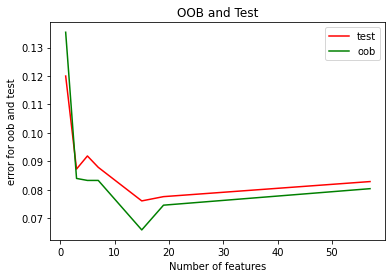

In [13]:
#Plotting oob and test errors
import matplotlib.pyplot as plt

accuracies=[1-0.88,1-0.9127,1-0.9081,1-0.9121,1-0.9239,1-0.9224,1-0.9171]
oob=[1-0.8646,1-0.9160,1-0.9167,1-0.9167,1-0.9341,1-0.9254,1-0.9196]

plt.plot(M, accuracies, color='r', label='test')
plt.plot(M, oob, color='g', label='oob')
  
# Naming the x-axis, y-axis and the whole graph
plt.xlabel("Number of features")
plt.ylabel("error for oob and test")
plt.title("OOB and Test")
  
# Adding legend, which helps us recognize the curve according to it's color
plt.legend()
  
# To load the display window
plt.show()

